In [1]:
from IPython.display import clear_output

# Оглавление

# 1. Общая идея

## 1.1 Why Should I Trust You?

Машинное обучение лежит в основе многих последних достижений в области науки и технологии.

У сожалению, компьютеры обычно не объясняют своих прогнозов. 
И это становится препятствием для внедрения моделей машинного обучения.
А если пользователи не доверяют модели или прогнозу, то они будут с опаской использовать их на практике.

Поэтому вопрос в том, как помочь пользователям доверять результатам, полученным с помощью моделей машинного или глубокого обучения.

Важно различать два разных (но связанных) определения доверия: 
1. Доверие к предсказанию, то есть доверяет ли пользователь отдельному предсказанию на столько, чтобы предпринять какие-то действия на его основе?
2. Доверие к модели, то есть, доверяет ли пользователь модели так, чтобы применять их на практике?

Оба напрямую подвержены влиянию того, на сколько человек понимает поведение модели, чтобы не рассматривать ее как черный ящик. 

Определение доверия к индивидуальным прогнозам является важным проблема, когда модель используется для принятия решений. Ведь, например, при медицинской диагностики или обнаружению террористов, предсказания не могут быть выполнены бездумно, так как последствия могут быть катастрофическими.

Помимо доверия индивидуальным предсказаниям, необходимо доверять модели "в целом". Чтобы принять это решение, пользователи должны быть уверенычто модель будет хорошо работать на реальных данных, согласно интересующим метрикам. Реальные данные часто значительно отличаются, ик, роме того, метрика оценки может не указывать на цель продукта. Изучение индивидуальных прогнозов и их объяснения - важная задача, которая может помочь пользователям, особенно для больших наборов данных.

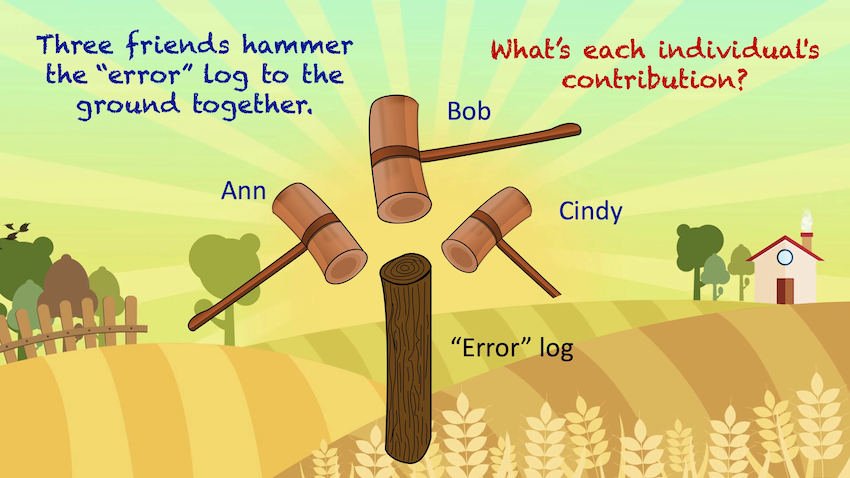

Практики часто переоценивают точность своих моделей, тому пример, известный случай с моделью, обученной отличать хаски олт волка.

Часто артефакты сбора данных могут вызвать нежелательные корреляции, которые классификаторы улавливают во время обучения. Эти проблемы может быть очень трудно определить, просто взглянув на необработанные данные и прогнозы.

Пример идеально решенной задачи, не применимой к практике - задача различить на фотографиях волков и эскимосских собак (хаски). Исследователи обучили классификатор логистической регрессии из 20 изображений, отобранный вручную так, чтобы на всех фотографиях волков фоном был снег, а на фотографиях хаски - нет.

Этот эксперимент демонстрирует полезность объяснения отдельных визуальных признаков, для понимания работы классификаторов. Перед тем, как принять решения о доверии к ним.

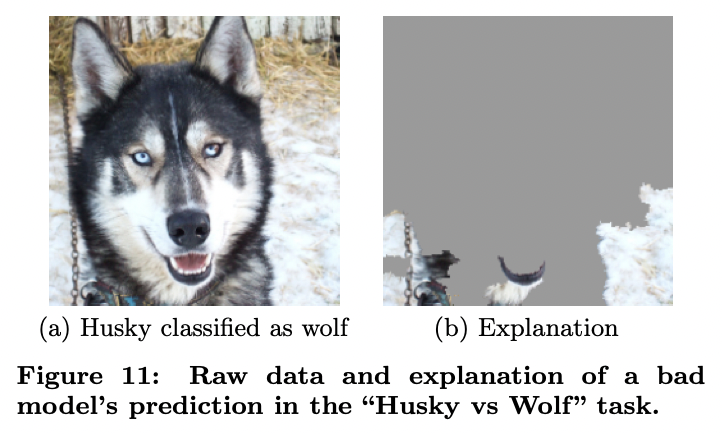

#### Критерии, которым должны отвечать Интерпретаторы

1. Результат должен быть интерпретируемым, т. е. обеспечивать качественное понимание взаимосвязи между входными переменными и ответом. Отметим, что интерпретируемость должна учитывать ограничения пользователя. Объяснения должны быть легкими для понимания,не обязательно соответствовать функциям, используемым моделью. Ну и конечно, понятие интерпретируемости зависит от целевой аудитории.

Например, возможное интерпретируемое представление для классификации текста - это двоичный вектор, обозначающий наличие или отсутствие слова. Даже если классификатор может использовать более сложные (и непонятные) функции, такие как вложения слов. Аналогичным образом для классификации изображений, интерпретируемое представление может быть двоичным вектором, указывающим «наличие» или «отсутствие» смежного участка аналогичных пикселей (суперпиксель), тогда как классификатор может представлять изображение в виде тензора с тремя цветовыми каналами на пиксель.

2. Еще один важный критерий - локальная точность. Чтобы иметь смысл, обьяснение должно соответствовать тому, как модель ведет себя конкретно для предсказываемого случая.

Отметим, что локальная точность не подразумевает глобальной точности: факторы, которые важны в глобальном масштабе, могут не иметь значения на местном контексте, и наоборот. 
В то время как глобальная точность не всегда будет означать локальную, выделяя глобально достоверные объяснения, сложных моделей, которые сложно интерпретировать для конкретного примера.

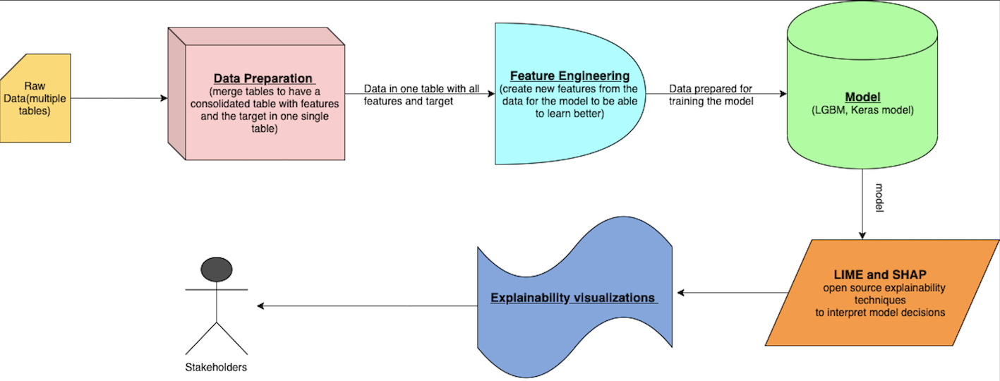

Метрики, например, accuracy, **часто может быть неподходящей метрикой для оценки модели, и мы это продемонстрируем.**

## 1.2 Как это работает?

## 1.3 Анализ влияния данных на результаты модели (Kaggle)

Мы рассмотрели примеры того, как можно самостоятельно, используя разлдичные базовые библиотеки, интерпретировать результаты моделей.

Далее, рассмотрим, библиотеки, которые позволяют интепретировать модель более наглядно.

## 1.4 Библиотеки для реализации explanation

Мы рассмотрим две библиотеки: SHAP и LIME.

Логика работы **SHAP (SHapley Additive exPlanations)** основана на значении Шепли.
Значение Шепли - это среднее значение предельных вкладов по всем перестановкам.

SHAP учитыват все возможные перестановки, таким образом, SHAP представляет собой единый подход, обеспечивающий глобальную и локальную согласованность и интерпретируемость.

Однако его цена - время, так как алгоритму нужно вычислить все перестановки, чтобы получить результаты.

Напротив, **LIME (Local Interpretable Model-agnostic Explanations)**, строит дискретные линейные модели вокруг индивидуального прогноза в его локальной окрестности. LIME на самом деле является подмножеством SHAP, но не имеет тех же свойств.

Преимущество LIME - скорость.
Алгоритм LIME изменяет данные вокруг отдельного прогноза для построения модели, в то время как SHAP должен вычислять все перестановки глобально, чтобы получить локальную точность. Кроме того, модуль SHAP Python, пока еще не имеет специально оптимизированных алгоритмов для всех типов алгоритмов (таких как KNN).

### 1.4.1 SHAP
Что такое и принцип работы

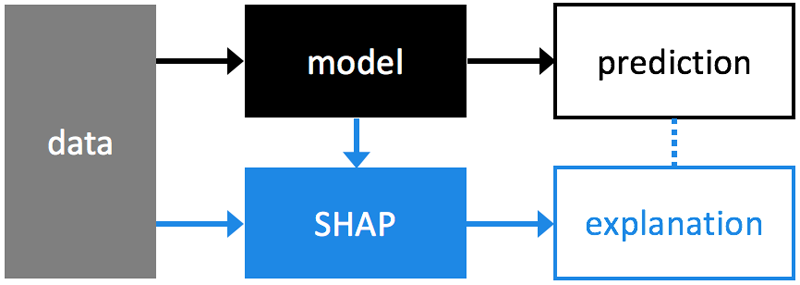

In [2]:
!pip install shap
clear_output()

In [3]:
import numpy as np
import torch
import shap

#### Пример обьяснения перевода с английского на русский
Рассмотрим пример интерпретации модели для предварительно обученной модели машинного перевода
[Machine Translation Example](https://shap.readthedocs.io/en/stable/example_notebooks/text_examples/translation/Machine%20Translation%20Explanation%20Demo.html)

Мы воспользуемся предобученными моделями - транформерами. 
Поэтому переведем начало статьи [How Transformers Work](https://towardsdatascience.com/transformers-141e32e69591)

In [4]:
!pip install sentencepiece
!pip install transformers
clear_output()

In [5]:
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM
import sentencepiece

In [6]:
lang = "en"
target_lang = "ru"
model_name = f'Helsinki-NLP/opus-mt-{lang}-{target_lang}'

# load the model and tokenizer
# Можно попробовать перевод и разными предобученными моделями
# Download the model and the tokenizer
model = AutoModelForSeq2SeqLM.from_pretrained(model_name)#.cuda() # если мы не используем ускоритель GPU, то .cuda() нужно убрать
tokenizer = AutoTokenizer.from_pretrained(model_name)


# define the input sentences we want to translate
data = [
    "Transformers are a type of neural network architecture that have been gaining popularity."# Transformers were developed to solve the problem of sequence transduction, or neural machine translation. That means any task that transforms an input sequence to an output sequence. This includes speech recognition, text-to-speech transformation, etc.."
]

clear_output()

In [7]:
# we build an explainer by passing the model we want to explain and
# the tokenizer we want to use to break up the input strings
explainer = shap.Explainer(model, tokenizer)

# explainers are callable, just like models
shap_values = explainer(data, fixed_context=1)

In [8]:
shap.plots.text(shap_values)

,Trans,former,s,are,a type,of,ne,ural,network,architecture,that,have,been,gaining,popularity,.,
,3.051,0.553,0.742,0.296,0.108,0.023,-0.081,-0.121,0.12,-0.165,0.144,-0.171,-0.292,-0.31,0.208,-0.222,0.0
Транс,14.789,0.976,0.926,-1.08,-0.04,-0.031,0.02,0.382,-0.051,-0.034,0.074,0.061,-0.33,-0.193,1.018,-0.033,-0.0
форм,-2.919,8.206,0.671,-0.18,0.085,0.133,0.226,0.076,-0.054,-0.02,0.048,0.035,0.012,0.021,0.218,0.013,-0.0
еры,3.148,3.662,5.0,-1.3,0.286,-0.08,-0.243,-0.271,-0.245,0.011,-0.161,-0.176,-0.073,-0.022,0.19,-0.18,-0.0
-,0.287,1.266,0.731,1.506,0.611,-0.11,0.163,0.003,-0.192,-0.161,-0.098,0.029,-0.136,-0.089,0.131,-0.315,-0.0
это,-0.279,-0.563,-0.357,3.562,-0.721,0.235,0.03,-0.091,-0.025,-0.326,0.409,0.009,-0.12,0.012,-0.144,-0.116,-0.0
тип,0.712,0.318,-0.005,-0.406,8.166,-0.791,-0.255,-0.175,0.637,0.06,-0.001,-0.035,-0.011,-0.003,0.253,-0.013,0.0
ней,-0.19,-0.375,-0.351,-0.396,-1.368,0.422,9.277,7.366,-0.551,-0.602,-0.331,-0.262,-0.295,-0.189,-0.074,-0.237,0.0
рон,-0.253,-0.355,-0.359,-0.398,-0.57,-0.749,2.663,3.185,-0.727,-0.007,0.172,-0.128,-0.151,-0.226,-0.174,-0.213,0.0
ной,0.037,0.18,0.166,-0.041,-0.008,0.317,0.115,0.71,0.985,0.963,0.855,-0.195,-0.203,-0.172,-0.146,-0.143,-0.0


### 1.4.2. LIME
Что такое и принцип работы

In [9]:
!pip install lime
clear_output()

#### Пример обьяснения классфикации статей по религиозному принципу

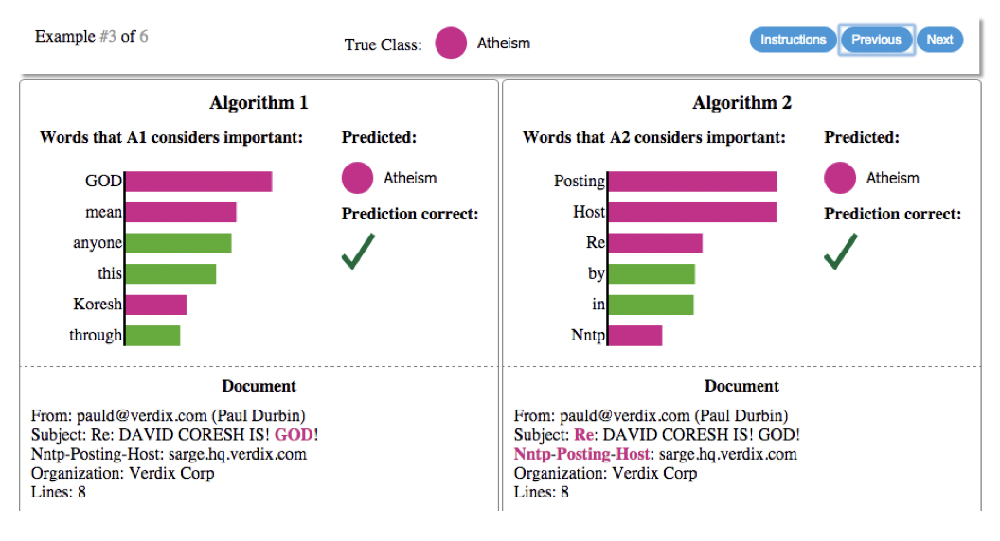

Используем датасет [fetch_20newsgroups](https://scikit-learn.org/stable/modules/generated/sklearn.datasets.fetch_20newsgroups.html): Данные [«The 20 Newsgroups»](http://qwone.com/~jason/20Newsgroups/) — это коллекция примерно из 20000 новостных документов, разделенная (приблизительно) равномерно между 20 различными категориями. Изначально она собиралась Кеном Ленгом (Ken Lang), возможно, для его работы «Newsweeder: Learning to filter netnews» («Новостной обозреватель: учимся фильтровать новости из сети»).

Коллекция «The 20 newsgroups» стала популярным набором данных для экспериментов с техниками машинного обучения для текстовых приложений, таких как классификация текста или его кластеризация.

https://marcotcr.github.io/lime/tutorials/Lime%20-%20multiclass.html

This time we will use Multinomial Naive Bayes for classification, so that we can make reference to [this document](https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.MultinomialNB.html?highlight=multinomial%20naive%20bayes#sklearn.naive_bayes.MultinomialNB).

In [10]:
import lime
import sklearn
import sklearn.ensemble
import sklearn.metrics
#from __future__ import print_function

from sklearn.datasets import fetch_20newsgroups
newsgroups_train = fetch_20newsgroups(subset='train')
newsgroups_test = fetch_20newsgroups(subset='test')
# making class names shorter
class_names = [x.split('.')[-1] if 'misc' not in x else '.'.join(x.split('.')[-2:]) for x in newsgroups_train.target_names]
class_names[3] = 'pc.hardware'
class_names[4] = 'mac.hardware'

class_names

['atheism',
 'graphics',
 'ms-windows.misc',
 'pc.hardware',
 'mac.hardware',
 'x',
 'misc.forsale',
 'autos',
 'motorcycles',
 'baseball',
 'hockey',
 'crypt',
 'electronics',
 'med',
 'space',
 'christian',
 'guns',
 'mideast',
 'politics.misc',
 'religion.misc']

In [11]:
# Again, let's use the tfidf vectorizer, commonly used for text.
vectorizer = sklearn.feature_extraction.text.TfidfVectorizer(lowercase=False)
train_vectors = vectorizer.fit_transform(newsgroups_train.data)
test_vectors = vectorizer.transform(newsgroups_test.data)

# Обучим модель
from sklearn.naive_bayes import MultinomialNB
nb = MultinomialNB(alpha=.01)
nb.fit(train_vectors, newsgroups_train.target)

# Сделаем предсказагие обученной модели
pred = nb.predict(test_vectors)
sklearn.metrics.f1_score(newsgroups_test.target, pred, average='weighted')

0.8350184193998174

We see that this classifier achieves a very high F score. The sklearn guide to 20 newsgroups indicates that Multinomial Naive Bayes overfits this dataset by learning irrelevant stuff, such as headers, by looking at the features with highest coefficients for the model in general. We now use lime to explain individual predictions instead.

**Вопрос:** что означает 0.8350184193998174 и как модель анализовала данныек, классифицируя их?

Используем для интерпретации LIME

In [14]:
from lime import lime_text
from sklearn.pipeline import make_pipeline
c = make_pipeline(vectorizer, nb)

from lime.lime_text import LimeTextExplainer
explainer = LimeTextExplainer(class_names=class_names)

Previously, we used the default parameter for label when generating explanation, which works well in the binary case. For the multiclass case, we have to determine for which labels we will get explanations, via the 'labels' parameter. Below, we generate explanations for labels 0 and 17.

In [15]:
idx = 1340
exp = explainer.explain_instance(newsgroups_test.data[idx],
                                 c.predict_proba, num_features=6,
                                 labels=[0, 17])
print('Document id: %d' % idx)
print('Predicted class =', class_names[nb.predict(test_vectors[idx]).reshape(1,-1)[0,0]])
print('True class: %s' % class_names[newsgroups_test.target[idx]])

Document id: 1340
Predicted class = atheism
True class: atheism


Now, we can see the explanations for different labels. Notice that the positive and negative signs are with respect to a particular label - so that words that are negative towards class 0 may be positive towards class 15, and vice versa
Another alternative is to ask LIME to generate labels for the top K classes. This is shown below with K=2. To see which labels have explanations, use the available_labels function

In [16]:
exp = explainer.explain_instance(newsgroups_test.data[idx],
                                 c.predict_proba, num_features=6,
                                 top_labels=2)
print(exp.available_labels())

[0, 15]


Now let's see some the visualization of the explanations. Notice that for each class, the words on the right side on the line are positive, and the words on the left side are negative. Thus, 'Caused' is positive for atheism, but negative for christian.

We notice that the classifier is using reasonable words (such as 'Genocide', 'Luther', 'Semitic', etc), as well as unreasonable ones ('Rice', 'owlnet'). Let's zoom in and just look at the explanations for class 'Atheism'.

In [17]:
#exp.show_in_notebook(text=False)
exp.show_in_notebook(text=newsgroups_test.data[idx], labels=(0,))

Looking at this example demonstrates that there can be useful signal in the header or quotes that would generalize - i.e., the Subject line. There is also signal that would not generalize (e.g. email addresses and institution names).

### 1.4.3. Другие библиотеки

[DEN](https://github.com/isaacrob/DEN) : We present a visualization algorithm based on a novel unsupervised Siameseneural network training regime and loss function, called Differentiating EmbeddingNetworks (DEN). The Siamese neural network finds differentiating or similarfeatures between specific pairs of samples in a dataset, and uses these features toembed the dataset in a lower dimensional space where it can be visualized. Unlikeexisting visualization algorithms such as UMAP ort-SNE, DEN is parametric,meaning it can be interpreted by techniques such as SHAP. To interpret DEN, wecreate an end-to-end parametric clustering algorithm on top of the visualization,and then leverage SHAP scores to determine which features in the sample spaceare important for understanding the structures shown in the visualization basedon the clusters found. We compare DEN visualizations with existing techniqueson a variety of datasets, including image and scRNA-seq data. We then showthat our clustering algorithm performs similarly to the state of the art despite nothaving prior knowledge of the number of clusters, and sets a new state of the arton FashionMNIST. Finally, we demonstrate finding differentiating features of adataset.

[XAI](https://towardsdatascience.com/xai-build-your-own-deep-learning-interpretation-algorithm-6e471b59af7) 

[Boruta](https://github.com/scikit-learn-contrib/boruta_py) - это метод выбора всех релевантных функций, изобретенный Витольдом Р. Рудницки и разработанный Мироном Б. Курса из ICM UW.

Boruta is an all relevant feature selection method, while most other are minimal optimal; this means it tries to find all features carrying information usable for prediction, rather than finding a possibly compact subset of features on which some classifier has a minimal error.
Why bother with all relevant feature selection? When you try to understand the phenomenon that made your data, you should care about all factors that contribute to it, not just the bluntest signs of it in context of your methodology (yes, minimal optimal set of features by definition depends on your classifier choice).

[Boruta Feature Selection](https://towardsdatascience.com/simple-example-using-boruta-feature-selection-in-python-8b96925d5d7a) 

#### Простота применения: [boruta_py](https://github.com/scikit-learn-contrib/boruta_py)

In [13]:
!pip install boruta
clear_output()

Boruta conforms to the sklearn api and can be used in a Pipeline as well as on it's own. Here we will demonstrate stand alone operation.

First we will instantiate an estimator that Boruta will use. Then we will instantiate a Boruta Object.
Boruta has confirmed only a few features as useful. When our run ended, Boruta was undecided on 2 features.
We can interrogate .support to understand which features were selected. .support returns an array of booleans that we can use to slice our feature matrix to include only relevant columns. Of course, .transform can also be used, as expected in the scikit API.

We can also interrogate the ranking of the unselected features with .ranking_

[Boruta Feature Selection (an Example in Python)](https://towardsdatascience.com/simple-example-using-boruta-feature-selection-in-python-8b96925d5d7a)

In [18]:
from sklearn.datasets import load_breast_cancer
from sklearn import preprocessing
import pandas as pd

# load the data trainging set
datasets = load_breast_cancer()
X = pd.DataFrame(datasets['data'], columns = datasets['feature_names'])
y = pd.Series(datasets['target'], name = 'target_values')
X[:2]

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,radius error,texture error,perimeter error,area error,smoothness error,compactness error,concavity error,concave points error,symmetry error,fractal dimension error,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.8,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.9,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.8,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902


In [19]:
X.shape, type(X), y.shape, type(y)

((569, 30), pandas.core.frame.DataFrame, (569,), pandas.core.series.Series)

In [20]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

X_train = X_train.values
X_test = X_test.values
y_train = y_train.values
y_test = y_test.values

X_train.shape, X_test.shape, y_train.shape, y_test.shape, type(y_test)

((455, 30), (114, 30), (455,), (114,), numpy.ndarray)

In [21]:
from sklearn.ensemble import RandomForestClassifier
# define random forest classifier
forest = RandomForestClassifier(n_jobs=-1, class_weight='balanced', max_depth=7)
forest.fit(X_train, y_train)

from sklearn.metrics import classification_report, accuracy_score
print(classification_report(y_test, forest.predict(X_test)))
print(accuracy_score(y_test, forest.predict(X_test)))

              precision    recall  f1-score   support

           0       0.93      0.91      0.92        47
           1       0.94      0.96      0.95        67

    accuracy                           0.94       114
   macro avg       0.94      0.94      0.94       114
weighted avg       0.94      0.94      0.94       114

0.9385964912280702


In [22]:
from boruta import BorutaPy

# define Boruta feature selection method
feat_selector = BorutaPy(forest, n_estimators='auto', verbose=2, random_state=1)

# find all relevant features
feat_selector.fit(X_train, y_train)

# check selected features
feat_selector.support_

# check ranking of features
feat_selector.ranking_

# call transform() on X to filter it down to selected features
X_filtered = feat_selector.transform(X_train)
clear_output()

In [23]:
# zip my names, ranks, and decisions in a single iterable
feature_ranks = list(zip(datasets.feature_names, 
                         feat_selector.ranking_, 
                         feat_selector.support_))

# iterate through and print out the results
for feat in feature_ranks:
    print('Feature: {:<25} Rank: {},  Keep: {}'.format(feat[0], feat[1], feat[2]))
    if feat[2] == False: del X[feat[0]]

X[:2]

Feature: mean radius               Rank: 1,  Keep: True
Feature: mean texture              Rank: 1,  Keep: True
Feature: mean perimeter            Rank: 1,  Keep: True
Feature: mean area                 Rank: 1,  Keep: True
Feature: mean smoothness           Rank: 1,  Keep: True
Feature: mean compactness          Rank: 1,  Keep: True
Feature: mean concavity            Rank: 1,  Keep: True
Feature: mean concave points       Rank: 1,  Keep: True
Feature: mean symmetry             Rank: 4,  Keep: False
Feature: mean fractal dimension    Rank: 4,  Keep: False
Feature: radius error              Rank: 1,  Keep: True
Feature: texture error             Rank: 7,  Keep: False
Feature: perimeter error           Rank: 1,  Keep: True
Feature: area error                Rank: 1,  Keep: True
Feature: smoothness error          Rank: 6,  Keep: False
Feature: compactness error         Rank: 4,  Keep: False
Feature: concavity error           Rank: 1,  Keep: True
Feature: concave points error      Rank: 1,

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,radius error,perimeter error,area error,concavity error,concave points error,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.8,1001.0,0.11840,0.27760,0.3001,0.14710,1.0950,8.589,153.40,0.05373,0.01587,25.38,17.33,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.9,1326.0,0.08474,0.07864,0.0869,0.07017,0.5435,3.398,74.08,0.01860,0.01340,24.99,23.41,158.8,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902


#### Повторим обучение уже БЕЗ "лишних" фичей
Давайте проверим, можем ли мы добиться такого же результата, если проанализируем и уберем "лишние" данные?

In [24]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

X_train = X_train.values
X_test = X_test.values
y_train = y_train.values
y_test = y_test.values

X_train.shape, X_test.shape, y_train.shape, y_test.shape, type(y_test)

((455, 23), (114, 23), (455,), (114,), numpy.ndarray)

In [25]:
# define random forest classifier
forest = RandomForestClassifier(n_jobs=-1, class_weight='balanced', max_depth=7)
forest.fit(X_train, y_train)

print(classification_report(y_test, forest.predict(X_test)))
print(accuracy_score(y_test, forest.predict(X_test)))

              precision    recall  f1-score   support

           0       0.96      0.96      0.96        49
           1       0.97      0.97      0.97        65

    accuracy                           0.96       114
   macro avg       0.96      0.96      0.96       114
weighted avg       0.96      0.96      0.96       114

0.9649122807017544


Now that we have identified the features to drop, we can confidently drop them and proceed with our normal routine. You may want to try other feature selection methods to suit your needs, but Boruta uses one of the most powerful algorithms out there, and is quick and easy to use.

# 2. Примеры explanations для разных видов данных

## 2.1 Tabular examples

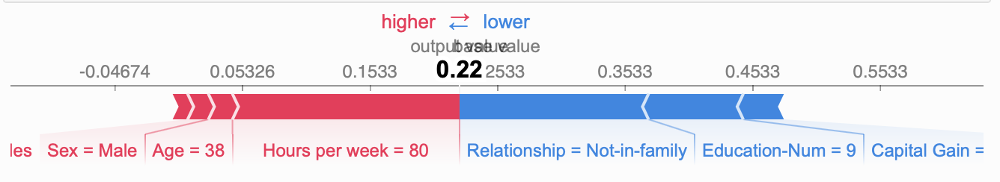

## 2.2 NLP: Пример абстрактного обобщения текста (потребуется время)

В этом примере интерпретируется модель генерации объяснений для предварительно обученной модели для составления краткого резюме статьи.

Используется датасет Extreme Summarization (XSum)(https://huggingface.co/sshleifer/distilbart-xsum-12-6)

In [26]:
!pip install datasets
clear_output()

In [27]:
from datasets import load_dataset
tokenizer = AutoTokenizer.from_pretrained("sshleifer/distilbart-xsum-12-6")
model =  AutoModelForSeq2SeqLM.from_pretrained("sshleifer/distilbart-xsum-12-6")#.cuda() # если мы не используем ускоритель GPU, то .cuda() нужно убрать
# помним, что .cuda() нужно убрать, если Вы не используете аппаратный ускоритель
 
dataset = load_dataset('xsum',split='train') # загружаем датасет
s = dataset['document'][0:1]                 # slice inputs from dataset to run model inference on
explainer = shap.Explainer(model,tokenizer)  # create an explainer object
shap_values = explainer(s)                   # Compute shap values
clear_output()

In [28]:
shap.plots.text(shap_values)                 # Visualize shap explanations

,"Recent reports have linked some France-based players with returns to Wales. ""I've always felt - and this is with my rugby hat on now; this is not region or WRU - I'd rather spend that money on keeping players in Wales,"" said Davies.","The WRU provides £2m to the fund and £1.3m comes from the regions. Former Wales and British and Irish Lions fly-half Davies became WRU chairman on Tuesday 21 October, succeeding deposed David Pickering following governing body elections.",He is now serving a notice period to leave his role as Newport Gwent Dragons chief executive after being voted on to the WRU board in September.,"Davies was among the leading figures among Dragons, Ospreys, Scarlets and Cardiff Blues officials who were embroiled in a protracted dispute with the WRU that ended in a £60m deal in August this year.","In the wake of that deal being done, Davies said the £3.3m should be spent on ensuring current Wales-based stars remain there.","In recent weeks, Racing Metro flanker Dan Lydiate was linked with returning to Wales. Likewise the Paris club's scrum-half Mike Phillips and centre Jamie Roberts were also touted for possible returns.","Wales coach Warren Gatland has said: ""We haven't instigated contact with the players. ""But we are aware that one or two of them are keen to return to Wales sooner rather than later."" Speaking to Scrum V on BBC Radio Wales, Davies re-iterated his stance, saying keeping players such as Scarlets full-back Liam Williams and Ospreys flanker Justin Tipuric in Wales should take precedence. ""It's obviously a limited amount of money [available]. The union are contributing 60% of that contract and the regions are putting £1.","3m in. ""So it's a total pot of just over £3m and if you look at the sorts of salaries that the... guys... have been tempted to go overseas for [are] significant amounts of money. ""So if we were to bring the players back, we'd probably get five or six players. ""And I've always felt - and this is with my rugby hat on now; this is not region or WRU - I'd rather spend that money on keeping players in Wales.","""There are players coming out of contract, perhaps in the next year or so… you're looking at your Liam Williams' of the world; Justin Tipuric for example - we need to keep these guys in Wales. ""We actually want them there. They are the ones who are going to impress the young kids, for example. ""They are the sort of heroes that our young kids want to emulate.","""So I would start off [by saying] with the limited pot of money, we have to retain players in Wales. ""Now, if that can be done and there's some spare monies available at the end, yes, let's look to bring players back. ""But it's a cruel world, isn't it? ""It's fine to take the buck and go, but great if you can get them back as well, provided there's enough money."" British and Irish Lions centre Roberts has insisted he will see out his Racing Metro contract. He and Phillips also earlier dismissed the idea of leaving Paris.",Roberts also admitted being hurt by comments in French Newspaper L'Equipe attributed to Racing Coach Laurent Labit questioning their effectiveness.,Centre Roberts and flanker Lydiate joined Racing ahead of the 2013-14 season while scrum-half Phillips moved there in December 2013 after being dismissed for disciplinary reasons by former club Bayonne.
New,0.695,2.745,0.537,0.411,0.111,0.165,-0.053,-0.022,-0.009,0.299,0.027,-0.01
Welsh,1.084,3.65,1.336,1.428,0.52,0.524,0.231,0.852,0.617,1.389,0.047,0.08
Rugby,0.906,1.247,0.644,0.73,0.334,0.466,0.795,0.52,0.366,1.49,0.051,0.052
Union,0.505,0.528,0.407,0.465,0.354,0.144,0.76,0.823,0.413,0.665,0.044,0.053
chairman,0.183,2.549,0.057,-0.033,0.241,-0.036,0.171,0.072,0.076,0.43,-0.106,-0.174
Gareth,0.903,0.404,-0.214,0.015,0.425,0.174,2.005,0.251,0.218,0.608,0.063,0.092
Davies,1.122,1.127,0.104,0.955,0.828,0.237,3.042,0.347,0.285,1.226,-0.109,-0.171
says,0.743,0.459,-0.312,-0.388,-0.005,0.068,-0.029,0.146,0.118,0.215,0.016,-0.009
a,0.025,0.671,-0.079

## 2.3 Image examples

### LIME

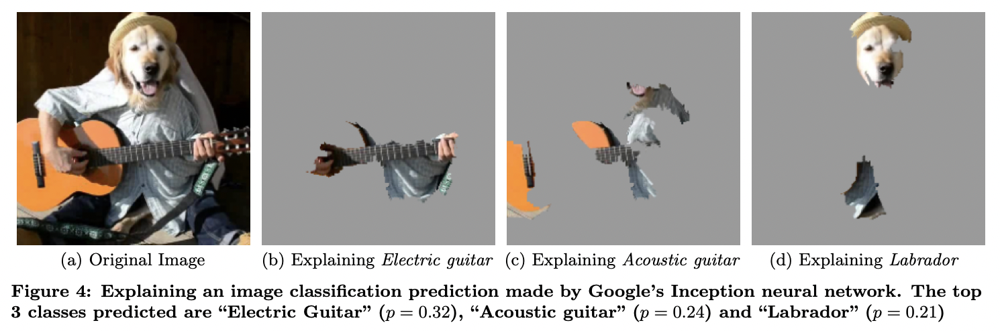

### Explain ResNet50 on ImageNet multi-class output using SHAP Partition Explainer

[Explain ResNet50 on ImageNet multi-class output using SHAP Partition Explainer](https://github.com/slundberg/shap/blob/master/notebooks/image_examples/image_classification/Image%20Multi%20Class.ipynb)

In [29]:
#!pip install opencv-python
#!conda install opencv
#clear_output()

In [30]:
import json
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input

In [31]:
# load pre-trained model and data
model = ResNet50(weights='imagenet')
X, y = shap.datasets.imagenet50()

102973440/102967424 [==============================] - 1s 0us/step


In [32]:
# getting ImageNet 1000 class names
url = "https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json"
with open(shap.datasets.cache(url)) as file:
    class_names = [v[1] for v in json.load(file).values()]
#print("Number of ImageNet classes:", len(class_names))
#print("Class names:", class_names)

In [33]:
# python function to get model output; replace this function with your own model function. 
def f(x):
    tmp = x.copy()
    preprocess_input(tmp)
    return model(tmp)

# define a masker that is used to mask out partitions of the input image. 
masker = shap.maskers.Image("inpaint_telea", X[0].shape)

# create an explainer with model and image masker 
explainer = shap.Explainer(f, masker, output_names=class_names)

# here we explain two images using 500 evaluations of the underlying model to estimate the SHAP values
shap_values = explainer(X[1:3], max_evals=500, batch_size=50, outputs=shap.Explanation.argsort.flip[:4])

Partition explainer:  50%|█████     | 1/2 [00:00<?, ?it/s]

Partition explainer: 3it [00:43, 14.64s/it]


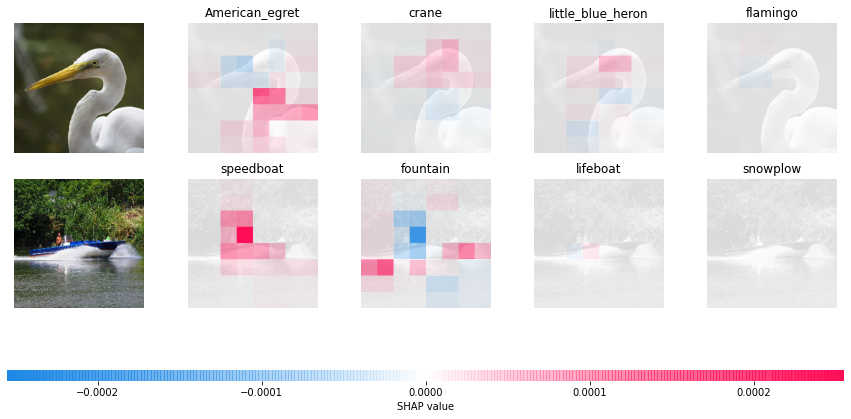

In [34]:
# output with shap values
shap.image_plot(shap_values)

Интерпретация объяснения вывода SHAP:

В первом примере данное изображение птицы классифицируется как американская цапля, а следующие вероятные классы - это журавль, цапля и фламинго. «Шишка» на шее птицы, по которой она классифицируется, как американская цапля против журавля, цапли или фламинго. Вы можете увидеть область шеи птицы, выделенную красным суперпикселем.

Во втором примере именно форма лодки позволяет классифицировать ее как быстроходный катер, а не как фонтан, спасательную шлюпку или снегоочиститель (выделено красным суперпикселями).

#  Bonus 1: Visualizing the Loss Landscape of Neural Nets

[Git](https://github.com/tomgoldstein/loss-landscape)

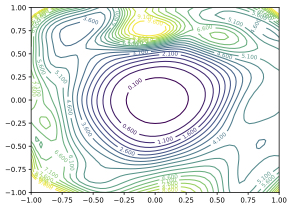

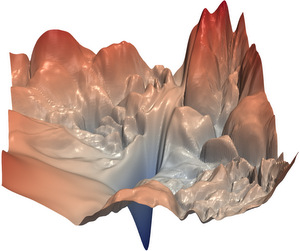

# Bonus 2: Визуализация методов оптимизации нейронных сетей

[Методы оптимизации нейронных сетей](https://habr.com/ru/post/318970/)

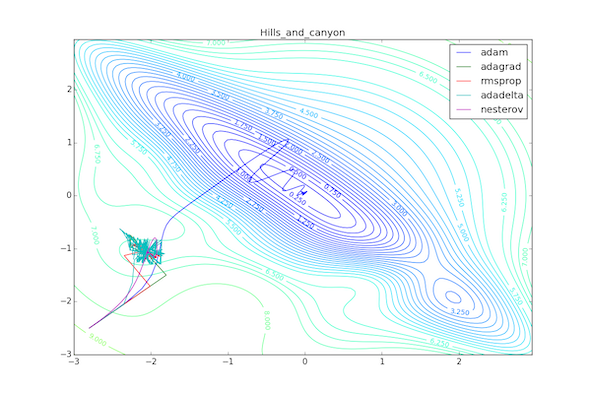

# 3. Список литературы

### Статьи

[How to Interpret Machine Learning Models with SHAP](https://www.youtube.com/watch?v=ylytZegK--I)

[Бесплатный курс от Kaggle: Machine Learning Explainability](https://www.kaggle.com/learn/machine-learning-explainability)

[EXPLAINABLE AI IN CREDIT RISK MANAGEMENT](https://arxiv.org/pdf/2103.00949v1.pdf)

[Predicting Driver Fatigue in Automated Driving with Explainability](https://arxiv.org/pdf/2103.02162v1.pdf)

[Fooling LIME and SHAP: Adversarial Attacks on Post hoc Explanation Methods](https://arxiv.org/pdf/1911.02508v2.pdf)

### SHAP
[Welcome to the SHAP documentation](https://shap.readthedocs.io/en/stable/index.html)

[Git](https://github.com/slundberg/shap)

[A Unified Approach to Interpreting Model Predictions](https://arxiv.org/pdf/1705.07874v2.pdf)

### LIME

[“Why Should I Trust You?” Explaining the Predictions of Any Classifier](https://arxiv.org/pdf/1602.04938.pdf)

[What does LIME really see in images?](https://arxiv.org/pdf/2102.06307v1.pdf)

[Git](https://github.com/marcotcr/lime)

### BORUTA
[Feature Selection with the Boruta Package](https://www.jstatsoft.org/index.php/jss/article/view/v036i11/v36i11.pdf)

# 4. Домашнее задание
В домашнем задании предлагается самостоятельно применить любую из бибилиотек explainability для разных видов данных

### 4.1 Изображения

1. Реализовать на Pytorch классификацию цифр Kannada - один из языков, на котором говорят жители провинции Karnataka в юго-западной Индии
https://www.kaggle.com/c/Kannada-MNIST

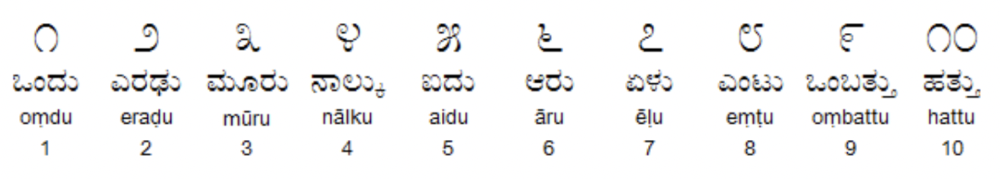

[Основа для кода](https://shap.readthedocs.io/en/latest/example_notebooks/image_examples/image_classification/PyTorch%20Deep%20Explainer%20MNIST%20example.html)

2. Изображения: при помощи готовой сети, напрмер, ResNet, Реализовать на Pytorch классификацию пчел от ос и обьяснить решения НС

### 4.2 NLP

1. Использовать любые два разных текста из базы статей разных научных направлений (например, нейронные сети и биология) или на разных языках (английский и немецкий) и обьяснить, как нейронная сеть отличает один тип текста, от другого

2. Сравнить обяснения различными бибилиотеками

3. Используя датасет fetch_20newsgroups, сделать анализ без кавычек и заголовков. Проанализировать, достаточно ли содержания самих статей для того, чтобы определить принадлежность автора к ..
[Explaining predictions without headers, quotes and footers](https://marcotcr.github.io/lime/tutorials/Lime%20-%20multiclass.html)

### 4.3 Табличные данные

1. Решение задачи регрессии Boston Housing или на примере другого датасета.. 